In [ ]:
!git clone https://github.com/rslim087a/track

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163
Receiving objects: 100% (12163/12163), 156.98 MiB | 13.63 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout,Convolution2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import random
import pandas as pd
import ntpath
import tensorflow as tf

In [ ]:
datadir='track'
columns=['center','left','right','steering','throttle','reverse','speed']
data=pd.read_csv(os.path.join(datadir,'driving_log.csv'),names=columns)
pd.set_option('display.max_colwidth',1)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [ ]:
def path_leaf(path):
  head,tail=ntpath.split(path)
  return tail

data['center']=data['center'].apply(path_leaf)
data['left']=data['left'].apply(path_leaf)
data['right']=data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


<BarContainer object of 25 artists>

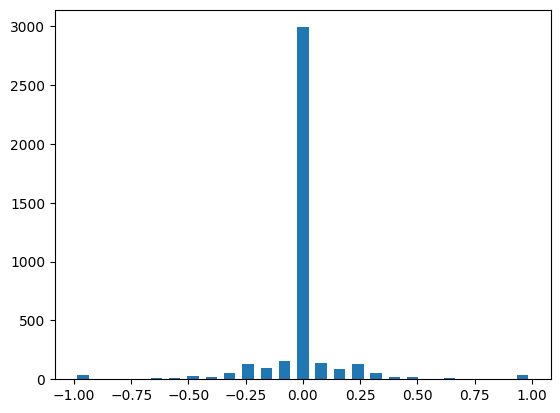

In [ ]:
num_bins=25
hist,bins=np.histogram(data['steering'],num_bins)
center=(bins[:-1]+bins[1:])*0.5
plt.bar(center,hist,width=0.05)


In [ ]:
print(hist[12])

2990


In [ ]:
print(bins[12])

-0.040000000000000036


In [ ]:
print(len(bins))

26


In [ ]:
print(bins[:-1])

[-1.   -0.92 -0.84 -0.76 -0.68 -0.6  -0.52 -0.44 -0.36 -0.28 -0.2  -0.12
 -0.04  0.04  0.12  0.2   0.28  0.36  0.44  0.52  0.6   0.68  0.76  0.84
  0.92]


In [ ]:
print(bins[1:])

[-0.92 -0.84 -0.76 -0.68 -0.6  -0.52 -0.44 -0.36 -0.28 -0.2  -0.12 -0.04
  0.04  0.12  0.2   0.28  0.36  0.44  0.52  0.6   0.68  0.76  0.84  0.92
  1.  ]


#Reason for adding bins[1:] and bins[:-1] is as follows

See in the distribution, the closes value to zero is -0.04 and +0.04

So If I create a vector which is a resultant of sum of these two I will have a value 0 in that for sure (-0.04 + 0.04=0.0) along with other values.

How to do that? but also maintain bin size?

1. A vector leave the left most element from main vector

2. B vector leave the rightmost element from main vector


(both now have 25 elements, cause in main vector there are 26 elements? Wait how? we said bin size to be 25 only right?


ans). One bin is described by its left edge and right edge so for one bin we have 2 values, so basically if m=no of bins and e=no of edges, then e = m+1 always so thats why 26)


Ok now Add A and B vector, basically A vector is like right shift and B vector is like left shift if I add them both I get central.


#Now we have done this all because we need zero as our reference point (zero: car moving in straight line in road (most ideal case))

Now we take average to get the new vector


In [ ]:
x=bins[1:]+bins[:-1]
print(x)
print(len(x))

[-1.92 -1.76 -1.6  -1.44 -1.28 -1.12 -0.96 -0.8  -0.64 -0.48 -0.32 -0.16
  0.    0.16  0.32  0.48  0.64  0.8   0.96  1.12  1.28  1.44  1.6   1.76
  1.92]
25


In [ ]:
print(hist)
x=x*0.5
print(x)

[  35    6    6    6   13    8   24   22   53  131   99  158 2990  137
   86  126   54   22   19    2    9    4    4    6   33]
[-0.96 -0.88 -0.8  -0.72 -0.64 -0.56 -0.48 -0.4  -0.32 -0.24 -0.16 -0.08
  0.    0.08  0.16  0.24  0.32  0.4   0.48  0.56  0.64  0.72  0.8   0.88
  0.96]


In [ ]:
print(len(hist))
print(len(x))

25
25


##If you see since we have driven in most ideal case always the no of data points towards zero, i.e, center of road is huge

In [ ]:
print(hist[12])
print(x[12])

2990
0.0


##THIS WOULD CREATE A BIAS SO WE NEED TO REMOVE SOME DATA POINTS WITH ZEROS

SO lets keep a threshold. say 400, see ideally we want it to be in center, but we also have to train model to handle cases where it aint in center and hence we are setting this threshold as 400, so that it is isnt biases heavily towards center but tries to reach this ideal center value

(array([3.50e+01, 6.00e+00, 6.00e+00, 6.00e+00, 1.30e+01, 8.00e+00,
        2.40e+01, 2.20e+01, 5.30e+01, 1.31e+02, 9.90e+01, 1.58e+02,
        2.99e+03, 1.37e+02, 8.60e+01, 1.26e+02, 5.40e+01, 2.20e+01,
        1.90e+01, 2.00e+00, 9.00e+00, 4.00e+00, 4.00e+00, 6.00e+00,
        3.30e+01]),
 array([-1.  , -0.92, -0.84, -0.76, -0.68, -0.6 , -0.52, -0.44, -0.36,
        -0.28, -0.2 , -0.12, -0.04,  0.04,  0.12,  0.2 ,  0.28,  0.36,
         0.44,  0.52,  0.6 ,  0.68,  0.76,  0.84,  0.92,  1.  ]),
 <BarContainer object of 25 artists>)

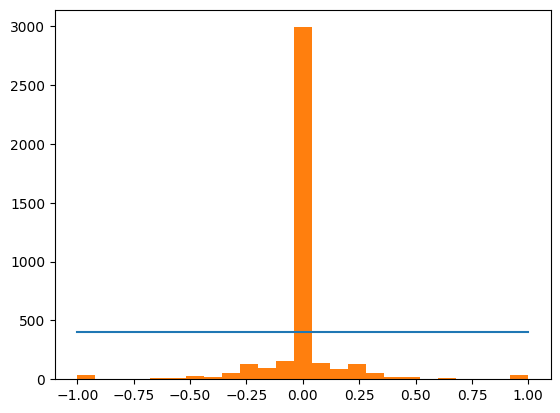

In [ ]:
threshold=400
plt.plot((np.min(data['steering']),np.max(data['steering'])),(threshold,threshold))
plt.hist(data['steering'],bins=25)

#Data balancing

In [ ]:
print("Total Data:",len(data))
print(data.shape)

Total Data: 4053
(4053, 7)


In [ ]:
remove_list=[]
for j in range(num_bins):
  list_=[]
  for i in range(len(data['steering'])):
    if data['steering'][i]>=bins[j] and data['steering'][i]<bins[j+1]:
      list_.append(i)
  list_=shuffle(list_)
  list_=list_[threshold:]
  remove_list.extend(list_)


print("Removed:",len(remove_list))
data.drop(data.index[remove_list],inplace=True)
print("Remaining Data:",len(data))

Removed: 2590
Remaining Data: 1463


The code aims to balance the dataset by removing excess samples from over-represented bins of steering angles. It collects indices of samples for each bin, shuffles them for randomness, and trims the list to keep a maximum of threshold samples per bin. If a bin has more than threshold samples, the excess indices are marked for removal. The line list_[threshold:] ensures no "index out of range" error occurs, as it returns an empty list if there are fewer than threshold elements. Finally, the collected indices are removed from the dataset to achieve balanced representation across bins.








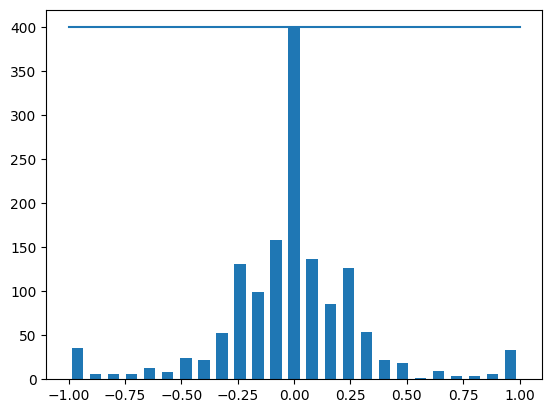

In [ ]:
hist,_=np.histogram(data['steering'],num_bins)
plt.bar(center,hist,width=0.05)
plt.plot((np.min(data['steering']),np.max(data['steering'])),(threshold,threshold))

In [ ]:
def load_img(datdir,df):
  image_path=[]
  steering=[]
  for i in range(len(data)):
    indexed_data=data.iloc[i]
    center=indexed_data[0]
    left=indexed_data[1]
    right=indexed_data[2]
    image_path.append(os.path.join(datdir,center.strip()))
    steering.append(float(indexed_data[3]))

    #left image append
    image_path.append(os.path.join(datdir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)

    #right image append
    image_path.append(os.path.join(datdir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths=np.asarray(image_path)
  steerings=np.asarray(steering)
  return image_paths,steerings

#ABOVE:

When a vehicle's camera is positioned on the left, the apparent steering angle tends to be sharper than when it's centered. Conversely, when on the right, the angle appears less sharp. This mimics the natural behavior of a driver adjusting the steering wheel to maintain the vehicle's position on the road.

By adjusting the steering angles for left and right images, you're effectively creating additional training data that helps the model generalize better. This technique is a form of data augmentation, which can improve the robustness and performance of the model by exposing it to different viewpoints and angles during training.


In [ ]:
image_paths,steerings=load_img(datadir+'/IMG',data)

In [ ]:
print(image_paths)
print(steerings)

['track/IMG/center_2018_07_16_17_11_43_670.jpg'
 'track/IMG/left_2018_07_16_17_11_43_670.jpg'
 'track/IMG/right_2018_07_16_17_11_43_670.jpg' ...
 'track/IMG/center_2018_07_16_17_16_30_911.jpg'
 'track/IMG/left_2018_07_16_17_16_30_911.jpg'
 'track/IMG/right_2018_07_16_17_16_30_911.jpg']
[ 0.    0.15 -0.15 ...  0.    0.15 -0.15]


In [ ]:
print(len(image_paths))
print(len(steerings))

4389
4389


In [ ]:
print(image_paths[23])
print(steerings[23])

track/IMG/right_2018_07_16_17_11_44_697.jpg
-0.5819619


In [ ]:
print(image_paths[22])
print(steerings[22])

track/IMG/left_2018_07_16_17_11_44_697.jpg
-0.2819619


In [ ]:
print(image_paths[21])
print(steerings[21])

track/IMG/center_2018_07_16_17_11_44_697.jpg
-0.4319619


In [ ]:
xtrain,xvalid,ytrain,yvalid=train_test_split(image_paths,steerings,test_size=0.2,random_state=6)
print("Training Samples:",len(xtrain))
print("Validation Samples:",len(xvalid))

Training Samples: 3511
Validation Samples: 878


Text(0.5, 1.0, 'Validation set')

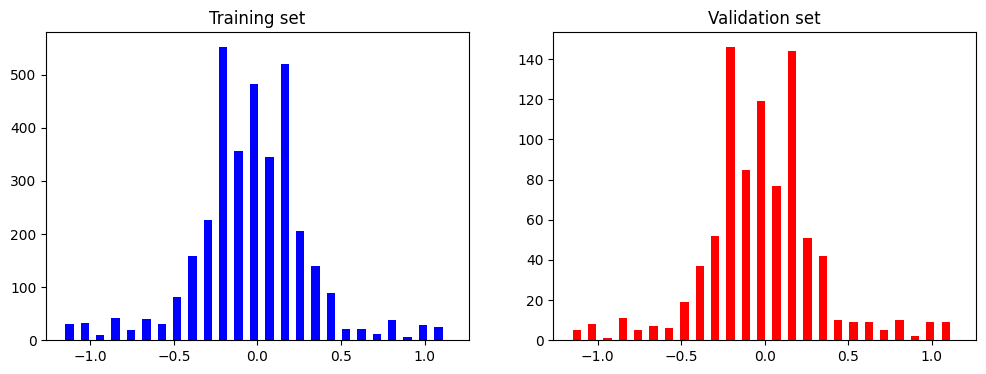

In [ ]:
fig,axes=plt.subplots(1,2,figsize=(12,4))
axes[0].hist(ytrain,bins=num_bins,width=0.05,color='blue')
axes[0].set_title('Training set')
axes[1].hist(yvalid,bins=num_bins,width=0.05,color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

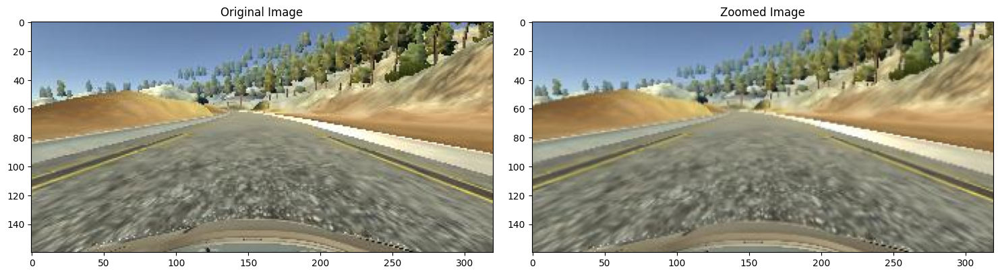

In [ ]:
def zoom(image):
  zoom=iaa.Affine(scale=(1,1.3))
  image=zoom.augment_image(image)
  return image

image=image_paths[random.randint(0,len(image_paths)-1)]
original_image=mpimg.imread(image)
zoomed_image=zoom(original_image)

fig,axes=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(zoomed_image)
axes[1].set_title('Zoomed Image')


Text(0.5, 1.0, 'Panned Image')

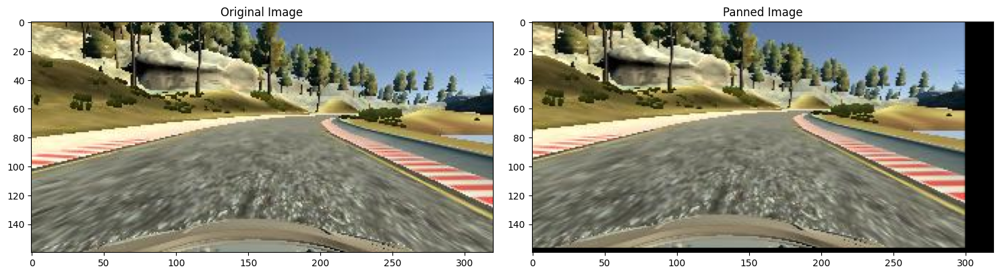

In [ ]:
def pan(image):
  pan=iaa.Affine(translate_percent={'x':(-0.1,0.1),'y':(-0.1,0.1)})
  image=pan.augment_image(image)
  return image



image=image_paths[random.randint(0,len(image_paths)-1)]
original_image=mpimg.imread(image)
panned_image=pan(original_image)

fig,axes=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(panned_image)
axes[1].set_title('Panned Image')


Text(0.5, 1.0, 'Changed Brightness Image')

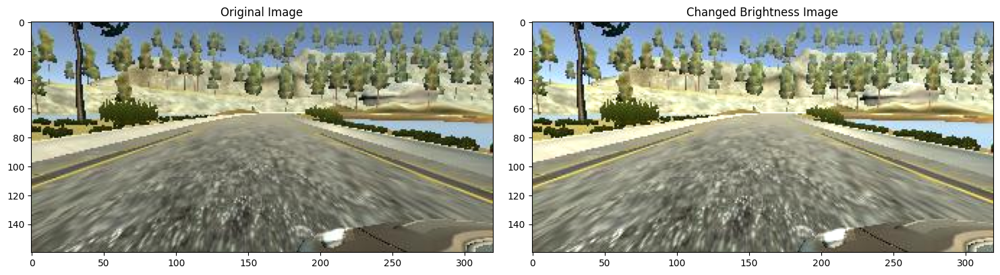

In [ ]:
def img_random_brightness(image):
  brightness=iaa.Multiply((0.2,1.2))
  image=brightness.augment_image(image)
  return image

image=image_paths[random.randint(0,len(image_paths)-1)]
original_image=mpimg.imread(image)
changed_brightness_image=img_random_brightness(original_image)

fig,axes=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(changed_brightness_image)
axes[1].set_title('Changed Brightness Image')


Text(0.5, 1.0, 'Flipped Image')

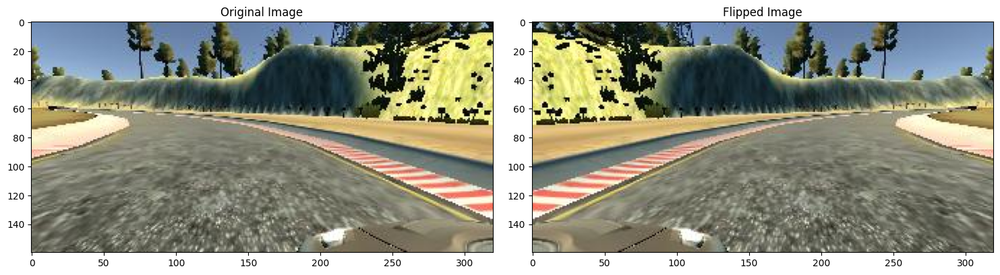

In [ ]:
def img_random_flip(image,steering_angle):
  image=cv2.flip(image,1)
  steering_angle=-steering_angle
  return image,steering_angle

random_index=random.randint(0,len(image_paths)-1)
image=image_paths[random_index]
steering_angle=steerings[random_index]
original_image=mpimg.imread(image)
flipped_image,flipped_steering_angle=img_random_flip(original_image,steering_angle)

fig,axes=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(flipped_image)
axes[1].set_title('Flipped Image')

In [ ]:
print("Original steering angle:",steering_angle)
print("Flipped steering angle:",flipped_steering_angle)

Original steering angle: -0.2960752
Flipped steering angle: 0.2960752


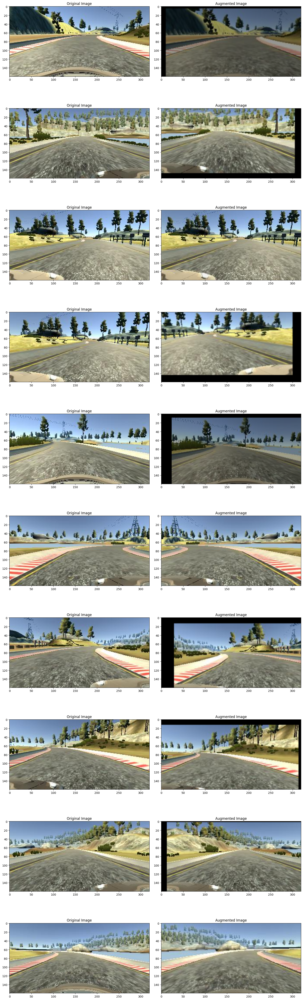

In [ ]:
def random_augment(image, steering_angle):
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

ncol = 2
nrow = 10

fig, axes = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(nrow):
    random_index = np.random.randint(0, len(image_paths)-1)
    image_path = image_paths[random_index]
    steering = steerings[random_index]

    image = mpimg.imread(image_path)

    augimg, steer = random_augment(image, steering)

    axes[i][0].imshow(image)
    axes[i][0].set_title('Original Image')

    axes[i][1].imshow(augimg)
    axes[i][1].set_title('Augmented Image')


In [ ]:
def img_preprocess(img):
  img=img[60:135,:,:]
  img=cv2.cvtColor(img,cv2.COLOR_RGB2YUV)
  img=cv2.GaussianBlur(img,(3,3),0)
  img=cv2.resize(img,(200,66))
  img=img/255
  return img

Text(0.5, 1.0, 'Preprocessed Image')

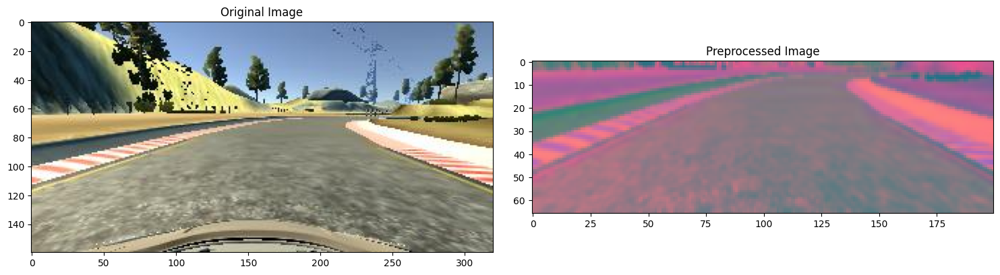

In [ ]:
image=image_paths[random.randint(0,len(image_paths)-1)]
original_image=mpimg.imread(image)
preprocessed_image=img_preprocess(original_image)

fig,axes=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(preprocessed_image)
axes[1].set_title('Preprocessed Image')

In [ ]:
!nvidia-smi

Fri Jun 28 15:42:04 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
    while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            random_index = random.randint(0, len(image_paths) - 1)
            image_path = image_paths[random_index]
            steering = steering_ang[random_index]

            if istraining:
                image = mpimg.imread(image_path)  # Read the image first
                image, steering = random_augment(image, steering)
            else:
                image = mpimg.imread(image_path)

            image = img_preprocess(image)
            batch_img.append(image)
            batch_steering.append(steering)

        yield np.asarray(batch_img), np.asarray(batch_steering)


In [ ]:
# Assuming xtrain, ytrain, xvalid, yvalid are defined
x_train_gen, y_train_gen = next(batch_generator(xtrain, ytrain, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(xvalid, yvalid, 1, 0))


Text(0.5, 1.0, 'Validation Image')

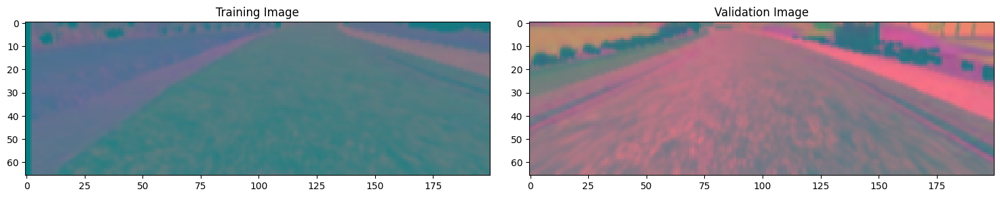

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [ ]:
def nvidia_model():
    model = Sequential([
        Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'),
        Conv2D(36, (5, 5), strides=(2, 2), activation='elu'),
        Conv2D(48, (5, 5), strides=(2, 2), activation='elu'),
        Conv2D(64, (5, 5), activation='elu'),
        Flatten(),
        Dense(100, activation='elu'),
        Dense(50, activation='elu'),
        Dense(10, activation='elu'),
        Dense(1)
    ])

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    return model

In [ ]:
model=nvidia_model()
print(model.summary())


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 1, 18, 64)         76864     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               115300    
                                                                 
 dense_1 (Dense)             (None, 50)                5

In [ ]:
history = model.fit_generator(batch_generator(xtrain, ytrain, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(xvalid, yvalid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

<ipython-input-43-16e98b077abf>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(xtrain, ytrain, 100, 1),


Epoch 1/10
300/300 [==============================] - 128s 402ms/step - loss: 0.1262 - val_loss: 0.0585
Epoch 2/10
300/300 [==============================] - 120s 401ms/step - loss: 0.0644 - val_loss: 0.0462
Epoch 3/10
300/300 [==============================] - 117s 392ms/step - loss: 0.0577 - val_loss: 0.0438
Epoch 4/10
300/300 [==============================] - 121s 404ms/step - loss: 0.0524 - val_loss: 0.0346
Epoch 5/10
300/300 [==============================] - 127s 425ms/step - loss: 0.0458 - val_loss: 0.0309
Epoch 6/10
300/300 [==============================] - 164s 549ms/step - loss: 0.0436 - val_loss: 0.0304
Epoch 7/10
300/300 [==============================] - 153s 511ms/step - loss: 0.0422 - val_loss: 0.0296
Epoch 8/10
300/300 [==============================] - 136s 456ms/step - loss: 0.0393 - val_loss: 0.0305
Epoch 9/10
300/300 [==============================] - 113s 379ms/step - loss: 0.0378 - val_loss: 0.0304
Epoch 10/10
300/300 [==============================] - 139s 463m

Text(0.5, 0, 'Epoch')

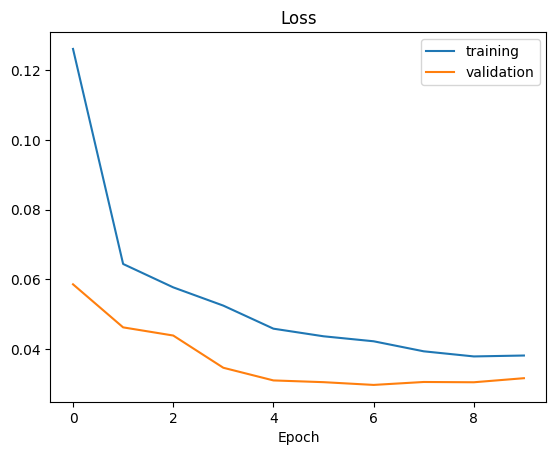

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
model.save('automodel.h5')
from google.colab import files
files.download('automodel.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>